# **Question 1.** Pick any **dataset** that contains spatial data and information (**preferably related to your course project**). Have a look at the list of publicly available spatial datasets here. You can also use Google Dataset Engine or HuggingFace to search for data. If needed, use geocoders to find the geographic coordinates (lat and log) given the location address.

This dataset is for my Term Project. It contains the information related to **electricity supply chain** (electricity demand, generation, distribution, load shedding) and other information of **Bangladesh**. The dataset contains **45 columns**.

In [1]:
from google.colab import drive
drive.mount('/content/drive')
import pandas as pd

file_path = "/content/drive/MyDrive/BPDP Folder/version 5.xlsx"
df = pd.read_excel(file_path)

df.head()


Mounted at /content/drive


,Date,Day of the week,Year,Month,Max. Demand at eve. peak (Generation end),Max. Demand at eve. peak (Sub-station end),Highest Generation (Generation end),Minimum Generation (Generation end),Day-peak Generation (Generation end),Evening-peak Generation (Generation end),...,Rangpur_supply,Rangpur_load,Cumilla_demand,Cumilla_supply,Cumilla_load,Khulna_demand,Khulna_supply,Khulna_load,Holiday name,Holiday_cat
0,2019-11-21,Thursday,2019,11,8785,8110.0,8785.0,5647.0,7294.7,8785,...,208,0,701,701,0,953,953,0,No Holiday,0
1,2019-11-22,Friday,2019,11,7886,7344.0,7886.0,5283.5,5725.9,7886,...,201,0,694,694,0,908,908,0,No Holiday,0
2,2019-11-23,Saturday,2019,11,8827,8197.0,8827.0,5200.0,6731.7,8946,...,210,0,729,729,0,974,974,0,No Holiday,0
3,2019-11-24,Sunday,2019,11,8855,8224.0,8855.0,5470.0,7062.8,8855,...,216,0,722,722,0,983,983,0,No Holiday,0
4,2019-11-25,Monday,2019,11,8982,8356.0,8978.0,5500.0,7110.7,8982,...,219,0,735,735,0,981,981,0,No Holiday,0


There is one more supplementary dataset that contains the **location and capacity of each power plant**. The dataset contains **155 power plants** including two importing points from India.

In [2]:
file_path = "/content/drive/MyDrive/BPDP Folder/BPDB_All_Stations.xlsx"
df1 = pd.read_excel(file_path)

df1.head()

,Zone,SL No.,Power Station Name,Latitude,Longitude,Installed Capacity (MW),Derated Capacity (MW)
0,Dhaka,1,Ghorashal Repowered CCPP Unit 3 (GT),23.980206,90.637268,260,260
1,Dhaka,2,Ghorasal Repowered CCPP UNIT-4,23.981989,90.637943,210,180
2,Dhaka,3,Ghorasal TPP Unit 5,23.980158,90.637189,210,190
3,Dhaka,4,Ghorashal 365 MW CCPP Unit -7,23.980005,90.639658,365,365
4,Dhaka,5,Ghorashal 108 MW PP (Regent),23.970613,90.641446,108,108


# **Question 2.** Data visualization is a powerful tool to bring data to life, convey information and help in decision making. Spatial data can be visualized in different formats such as **chloropleth map, cartogram map, bubble map, hexagonal binning, heat map, cluster map**. Write Python script in a Jupyter notebook format to visualize this data in different formats and report the insights that you may observe from these visualizations. Observations can be reported in a markdown cell to be part of the same Jupyter notebook.

# **Data Visualization using Power Plants Dataset**

**Choropleth Map for Plant Location and Zone Wise Capacity**

In [3]:
import pandas as pd
import folium
import requests
import json # Import the standard json library

# 1. Prepare the Data
# Ensure df1 is loaded and aggregate capacity by Zone
# Create a mapping for zone names to match GeoJSON properties
# The GeoJSON data uses names like "Chittagong", "Dhaka", etc.
zone_name_map = {
    'Barisal': 'Barisal',
    'Chattogram': 'Chittagong',
    'Comilla': 'Chittagong',   # Map Comilla to Chittagong Division for GeoJSON matching
    'Dhaka': 'Dhaka',
    'Khulna': 'Khulna',
    'Mymensingh': 'Mymensingh',
    'Rajshahi': 'Rajshahi',
    'Rangpur': 'Rangpur',
    'Sylhet': 'Sylhet'
}

# Apply the mapping to df1 and then aggregate
df1['Mapped_Zone'] = df1['Zone'].map(zone_name_map)
zone_summary = df1.groupby('Mapped_Zone')['Installed Capacity (MW)'].sum().reset_index()

# Clean 'Latitude' and 'Longitude' columns in df1 before using them
# Ensure Latitude and Longitude columns are treated as strings first
df1['Latitude'] = df1['Latitude'].astype(str)
df1['Longitude'] = df1['Longitude'].astype(str)

# Extract only the latitude part if a comma is present in the 'Latitude' column
df1['Latitude'] = df1['Latitude'].apply(lambda x: x.split(',')[0].strip() if ',' in x else x)

# Now convert both columns to numeric, coercing errors to NaN
df1['Latitude'] = pd.to_numeric(df1['Latitude'], errors='coerce')
df1['Longitude'] = pd.to_numeric(df1['Longitude'], errors='coerce')

# 2. Get Bangladesh GeoJSON (Division level) for choropleth
# Using a public repository for administrative divisions
geojson_url = 'https://geodata.ucdavis.edu/gadm/gadm4.1/json/gadm41_BGD_1.json'
response = requests.get(geojson_url)

# Check if the request was successful
if response.status_code == 200:
    try:
        # Attempt to parse using response.json() first
        geojson_data = response.json()
    except requests.exceptions.JSONDecodeError:
        # If response.json() fails, try parsing response.text with json.loads
        # This can sometimes handle subtle encoding or formatting issues better
        # or provide more control.
        try:
            geojson_data = json.loads(response.text)
        except json.JSONDecodeError as e:
            print(f"Failed to decode JSON from {geojson_url}: {e}")
            print(f"Content that caused the error (first 500 chars): {response.text[:500]}")
            # Re-raise the error if it still fails
            raise
else:
    # Handle cases where the request itself failed (e.g., 404, 500)
    print(f"Failed to retrieve GeoJSON data. Status code: {response.status_code}")
    print(f"Response text: {response.text}")
    raise Exception(f"Failed to retrieve GeoJSON data from {geojson_url}")

# --- Debugging: Print values for inspection --- START
print("Zone Summary Head:")
print(zone_summary.head())
print("\nGeoJSON Feature Properties (first 5 features):")
for i, feature in enumerate(geojson_data['features'][:5]):
    print(f"Feature {i}: {feature['properties']}")
# --- Debugging: Print values for inspection --- END


# 3. Initialize the Map
m = folium.Map(location=[23.6850, 90.3563], zoom_start=7, tiles='CartoDB positron') # Changed tiles back to 'CartoDB positron'

# 4. Create the Choropleth Layer (The Boundaries)
folium.Choropleth(
    geo_data=geojson_data,
    name="choropleth",
    data=zone_summary,
    columns=["Mapped_Zone", "Installed Capacity (MW)"], # Use the new column for matching
    key_on="feature.properties.NAME_1", # Matches division names from the new GeoJSON (e.g., "Chittagong")
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0,
    legend_name="Total Installed Capacity (MW) per Zone",
    nan_fill_color=None
).add_to(m)

# 5. Optional: Add individual plant locations as small dots
df_geo = df1.dropna(subset=['Latitude', 'Longitude'])
for idx, row in df_geo.iterrows():
    folium.RegularPolygonMarker(
        location=[row['Latitude'], row['Longitude']],
        number_of_sides=4, # To create a triangle
        radius=4, # Adjust radius for better visibility if needed
        color='darkblue',
        fill=True,
        fill_color='darkblue',
        fill_opacity=0.7,
        popup=f"{row['Power Station Name']}<br>Lat: {row['Latitude']:.4f}<br>Lon: {row['Longitude']:.4f}"
    ).add_to(m)

# Display the map
m

Zone Summary Head:
  Mapped_Zone  Installed Capacity (MW)
0     Barisal                     2266
1  Chittagong                     7400
2       Dhaka                     5828
3      Khulna                     3858
4  Mymensingh                      654

GeoJSON Feature Properties (first 5 features):
Feature 0: {'GID_1': 'BGD.1_1', 'GID_0': 'BGD', 'COUNTRY': 'Bangladesh', 'NAME_1': 'Barisal', 'VARNAME_1': 'Bakerganj', 'NL_NAME_1': 'NA', 'TYPE_1': 'Bibhag', 'ENGTYPE_1': 'Division', 'CC_1': '10', 'HASC_1': 'BD.BA', 'ISO_1': 'NA'}
Feature 1: {'GID_1': 'BGD.2_1', 'GID_0': 'BGD', 'COUNTRY': 'Bangladesh', 'NAME_1': 'Chittagong', 'VARNAME_1': 'Chattagram|ParbattyaChattagram|', 'NL_NAME_1': 'NA', 'TYPE_1': 'Bibhag', 'ENGTYPE_1': 'Division', 'CC_1': '20', 'HASC_1': 'BD.CG', 'ISO_1': 'NA'}
Feature 2: {'GID_1': 'BGD.3_1', 'GID_0': 'BGD', 'COUNTRY': 'Bangladesh', 'NAME_1': 'Dhaka', 'VARNAME_1': 'Daca|Dacca', 'NL_NAME_1': 'NA', 'TYPE_1': 'Bibhag', 'ENGTYPE_1': 'Division', 'CC_1': '30', 'HASC_1': 'BD

**Findings**: Although the density is higher in the middle part, power plants are distributed all over the country.

**Bubble Map to Visualize the Capacities of Each Plants**

In [4]:
import requests
import json

df_geo['Scaled_Capacity'] = df_geo['Installed Capacity (MW)'] / 50
df_geo.head()

m_bubble = folium.Map(location=[23.6850, 90.3563], zoom_start=7, tiles='CartoDB positron')


for idx, row in df_geo.iterrows():
    if pd.notna(row['Latitude']) and pd.notna(row['Longitude']):
        folium.CircleMarker(
            location=[row['Latitude'], row['Longitude']],
            radius=row['Scaled_Capacity'],  # Use scaled capacity for bubble size
            color='blue',
            fill=True,
            fill_color='darkblue',
            fill_opacity=0.6,
            popup=f"<b>{row['Power Station Name']}</b><br>Zone: {row['Zone']}<br>Capacity: {row['Installed Capacity (MW)']} MW"
        ).add_to(m_bubble)

m_bubble

**Findings:** Power plants have higher capacities which are located in the southern part of the country compared to the nothern part. There is strong correlation with the industrialization.

# **Data Visualization Using Primary Dataset**

**Choropleth Map: Average Load Shedding Per Zone**

In [5]:
load_shedding_cols = [col for col in df.columns if col.endswith('_load')]

division_avg_load_shedding = pd.Series(dtype='float64')
for col in load_shedding_cols:
    division_name = col.replace('_load', '')
    division_avg_load_shedding[division_name] = df[col].mean()

print("Average Load Shedding per Division (before mapping):\n", division_avg_load_shedding)

division_name_map = {
    'Dhaka': 'Dhaka',
    'Chattogram': 'Chittagong',
    'Rajshahi': 'Rajshahi',
    'Mymensingh': 'Mymensingh',
    'Sylhet': 'Sylhet',
    'Barishal': 'Barisal',
    'Rangpur': 'Rangpur',
    'Cumilla': 'Chittagong', # Map Cumilla to Chittagong Division for GeoJSON matching
    'Khulna': 'Khulna'
}

# Apply the mapping to the index of the Series
mapped_avg_load_shedding = division_avg_load_shedding.rename(index=division_name_map)

# Group by the mapped division names and sum the average load shedding
# (assuming summing makes sense for combining load shedding from sub-regions into a larger division)
final_avg_load_shedding = mapped_avg_load_shedding.groupby(mapped_avg_load_shedding.index).sum()

# Convert to DataFrame
final_avg_load_shedding_df = final_avg_load_shedding.reset_index()
final_avg_load_shedding_df.columns = ['Division', 'Average Load Shedding (MW)']

print("Average Load Shedding per Division (after mapping and aggregation):")
print(final_avg_load_shedding_df)


import folium
import requests
import json

# Initialize the Map centered on Bangladesh
m_loadshedding = folium.Map(location=[23.6850, 90.3563], zoom_start=7, tiles='CartoDB positron')

# Get Bangladesh GeoJSON (Division level)
# Using the same public repository for administrative divisions as before
geojson_url = 'https://geodata.ucdavis.edu/gadm/gadm4.1/json/gadm41_BGD_1.json'
response = requests.get(geojson_url)

# Check if the request was successful
if response.status_code == 200:
    try:
        geojson_data = response.json()
    except requests.exceptions.JSONDecodeError:
        try:
            geojson_data = json.loads(response.text)
        except json.JSONDecodeError as e:
            print(f"Failed to decode JSON from {geojson_url}: {e}")
            print(f"Content that caused the error (first 500 chars): {response.text[:500]}")
            raise
else:
    print(f"Failed to retrieve GeoJSON data. Status code: {response.status_code}")
    print(f"Response text: {response.text}")
    raise Exception(f"Failed to retrieve GeoJSON data from {geojson_url}")

# Create the Choropleth Layer
folium.Choropleth(
    geo_data=geojson_data,
    name="choropleth",
    data=final_avg_load_shedding_df,
    columns=["Division", "Average Load Shedding (MW)"],
    key_on="feature.properties.NAME_1", # Matches division names from the GeoJSON
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Average Load Shedding (MW)",
    nan_fill_color="white" # Divisions with no data will be white
).add_to(m_loadshedding)

# Add tooltips to the choropleth layer for better interactivity
folium.GeoJson(
    geojson_data,
    style_function=lambda feature: {
        'fillColor': '#ffffff',
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0
    },
    tooltip=folium.GeoJsonTooltip(fields=['NAME_1'], aliases=['Division:'], localize=True)
).add_to(m_loadshedding)


# Display the map
m_loadshedding

Average Load Shedding per Division (before mapping):
 Dhaka         25.956757
Chattogram     5.490811
Rajshahi      11.209189
Mymensingh    35.081081
Sylhet         6.991351
Barishal       0.754054
Rangpur       13.618919
Cumilla       16.682162
Khulna        11.190270
dtype: float64
Average Load Shedding per Division (after mapping and aggregation):
     Division  Average Load Shedding (MW)
0     Barisal                    0.754054
1  Chittagong                   22.172973
2       Dhaka                   25.956757
3      Khulna                   11.190270
4  Mymensingh                   35.081081
5    Rajshahi                   11.209189
6     Rangpur                   13.618919
7      Sylhet                    6.991351


**Findings:** Load shedding varies with respect to the zones of the country. It is severe in Mymensingh zone and better at Barishal zone.

**Heatmap: Correlation Between Variables**

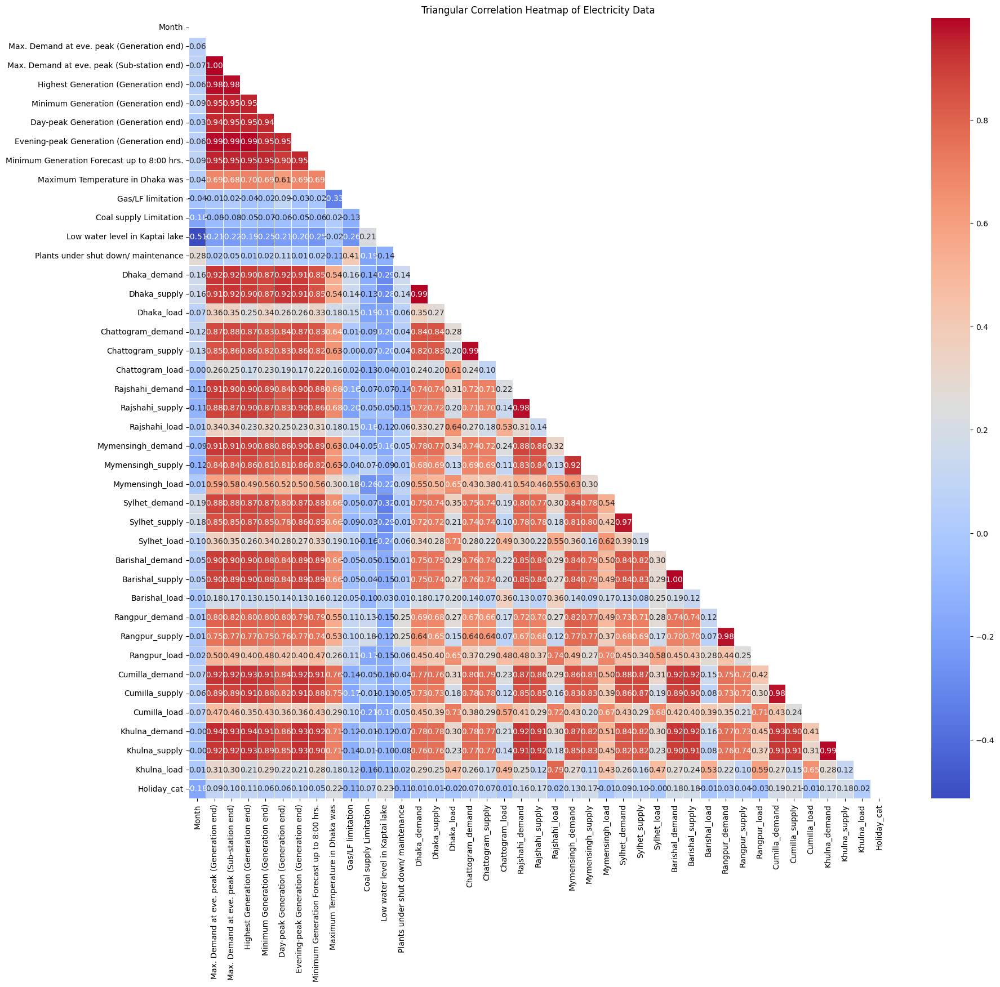

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Identify numerical columns, excluding 'Year'
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
exclude_cols = ['Year']
heatmap_cols = [col for col in numeric_cols if col not in exclude_cols]

# Calculate the correlation matrix
correlation_matrix = df[heatmap_cols].corr()

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Generate the triangular heatmap
plt.figure(figsize=(20, 18))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, mask=mask)
plt.title('Triangular Correlation Heatmap of Electricity Data')
plt.show()

**Findings:** There are strong correlation among the generation related variables, demand and supply of each region and regional demands across the country.

# **Question 3.** Pick any two points of interest (preferably in Saudi Arabia) and add markers on the map to highlight these two points.

Here, I have taken two points from the study location of my project. The points are located in **Bangladesh**. The source point is **Dhaka**, the capital of Banladesh, and the destination point is **Munshiganj**, my home city.

In [ ]:
# Neccessary Libraries

!pip install folium
from importlib.metadata import version

pkgs = ["folium"]
for p in pkgs:
    print(f"{p} version: {version(p)}")

folium version: 0.20.0


In [ ]:
# Points Pickup and Marker Addition

import folium

center=(23.616323792862175, 90.33246279354506) # Roughly Middle Point
source_point = (23.727830794877338, 90.41059898312186) # Dhaka Zero Point
destination_point = (23.568477451826425, 90.36737244236336) # South Tajpur Govt. Primary School, Munshiganj

m = folium.Map(location=center, zoom_start=10, zoom_control=True, scrollWheelZoom=True, dragging=True)
folium.Marker(location=source_point,icon=folium.Icon(color='red',icon='city', prefix='fa'), tooltip="Dhaka - Capital").add_to(m)
folium.Marker(location=center,icon=folium.Icon(color='blue',icon='road', prefix='fa'), tooltip="Nimtola").add_to(m)
folium.Marker(location=destination_point,icon=folium.Icon(color='green',icon='house', prefix='fa'), tooltip="Munshiganj - Home City").add_to(m)
m

# **Question 4.** Find and render the routes between the two selected points using BFS, DFS, Dijkstra and simulated annealing. Compare these routing algorithms in terms of time and cost (route length in meters).

**Shortest Path finding between Dhaka and Munshigaj using BFS, DFS, Dijkstra and SA**

In [ ]:
!pip install osmnx
!pip install optalgotools

import osmnx
from optalgotools.structures import Node
from optalgotools.routing import cost, draw_route
from optalgotools.algorithms.graph_search import BFS, DFS, Dijkstra
import pandas as pd
pd.options.compute.use_numexpr = False # for pandas \u2265 1.0, Disable numexpr for all subsequent pandas eval/query operations

# Set up the map reference point as the midpoint between the selected points
reference_point = ((source_point[0]+destination_point[0])/2, (source_point[1]+destination_point[1])/2)

# Increase 'dist' to cover the distance between the two points (e.g., 20km = 20000 meters)
G = osmnx.graph_from_point(reference_point, dist=20000, simplify=True)

# Get the osmid of the nearest nodes to the points
origin_id = osmnx.distance.nearest_nodes(G, source_point[1], source_point[0])
destination_id = osmnx.distance.nearest_nodes(G, destination_point[1], destination_point[0])

# Convert the source and destination nodes to Node
origin = Node(graph=G, osmid=origin_id)
destination = Node(graph=G, osmid=destination_id)

**Breadth First Search (BFS)**

In [ ]:
solution_bfs = BFS(origin, destination)
route_bfs = solution_bfs.result
draw_route(G,route_bfs)

In [ ]:
#Outcome

BFS_cost = cost(G, route_bfs)
BFS_time = solution_bfs.time
BFS_space = solution_bfs.space
BFS_explored = solution_bfs.explored

print(f"Cost: {BFS_cost} m")
print(f"Process time: {BFS_time} s")
print(f"Space required: {BFS_space} bytes")
print(f"Explored nodes: {BFS_explored}")


Cost: 42357.0906 m
Process time: 2.2837820810000267 s
Space required: 7624 bytes
Explored nodes: 11963


**Depth First Search (DFS)**

In [ ]:
solution_dfs = DFS(origin, destination)
route_dfs = solution_dfs.result
draw_route(G,route_dfs)

In [ ]:
#Outcome

DFS_cost = cost(G, route_dfs)
DFS_time = solution_dfs.time
DFS_space = solution_dfs.space
DFS_explored = solution_dfs.explored

print("DFS Results")
print(f"Cost: {DFS_cost} m")
print(f"Process time: {DFS_time} s")
print(f"Space required: {DFS_space} bytes")
print(f"Explored nodes: {DFS_explored}")


DFS Results
Cost: 799860.9872 m
Process time: 15.343809039000007 s
Space required: 38248 bytes
Explored nodes: 27652


**Dijkstra Algorithm**

In [ ]:
unrelaxed_nodes = [Node(G, osmid) for osmid in G.nodes()]
solution_dik = Dijkstra(origin, destination, unrelaxed_nodes)
route_dik = solution_dik.result
draw_route(G,route_dik)

In [ ]:
#Outcome

Dijkstra_cost = cost(G, route_dik)
Dijkstra_time = solution_dik.time
Dijkstra_space = solution_dik.space
Dijkstra_explored = solution_dik.explored

print("Dijkstra Results")
print(f"Cost: {Dijkstra_cost} m")
print(f"Process time: {Dijkstra_time} s")
print(f"Space required: {Dijkstra_space} bytes")
print(f"Explored nodes: {Dijkstra_explored}")

Dijkstra Results
Cost: 24723.7808 m
Process time: 794.9171662080003 s
Space required: 444376 bytes
Explored nodes: 50911


**Simulated Annealing**

In [ ]:
#Import Libraries

!pip install simanneal

from simanneal import Annealer
import networkx as nx
import random
import time
import sys




In [ ]:
class SARoute(Annealer):

    def energy(self):
        return cost(G, self.state)

    def move(self):
        if len(self.state) <= 3:
            return
        idx = random.randint(1, len(self.state)-2)
        split_node = self.state[idx]
        try:
            new_subpath = nx.shortest_path(G, split_node, destination_id, weight='length')
            self.state = self.state[:idx] + new_subpath
        except:
            pass


In [ ]:
#Define Class

initial_route = nx.shortest_path(G, origin_id, destination_id, weight='length')

start_time = time.time()

sa = SARoute(initial_route)
sa.Tmax = 10000
sa.Tmin = 1
sa.steps = 10000

best_route, best_cost = sa.anneal()

end_time = time.time()

class Result: pass
solution_sa = Result()
solution_sa.result = best_route
solution_sa.time = end_time - start_time
solution_sa.space = sys.getsizeof(best_route)
solution_sa.explored = sa.steps

route_sa = solution_sa.result

draw_route(G, route_sa)


 Temperature        Energy    Accept   Improve     Elapsed   Remaining


In [ ]:
#Outcome

SA_cost = cost(G, route_sa)
SA_time = solution_sa.time
SA_space = solution_sa.space
SA_explored = solution_sa.explored

print("Simulated Annealing Results")
print(f"Cost: {SA_cost} m")
print(f"Process time: {SA_time} s")
print(f"Space required: {SA_space} bytes")
print(f"Explored nodes: {SA_explored}")

Simulated Annealing Results
Cost: 24723.7808 m
Process time: 310.46831703186035 s
Space required: 920 bytes
Explored nodes: 10000


**Comparison of the BFS, DFS, Dijkstra and SA using Cost (Distance in meter) and Time (in second)**

In [ ]:
results = [
    ("BFS", BFS_cost, BFS_time),
    ("DFS", DFS_cost, DFS_time),
    ("Dijkstra", Dijkstra_cost, Dijkstra_time),
    ("Simulated Annealing", SA_cost, SA_time)
]

print(f"{'Algorithm':<22}{'Cost (m)':<15}{'Time (s)':<12}")
print("-" * 49)

for name, cost_val, time_val in results:
    print(f"{name:<22}{cost_val:<15.2f}{time_val:<12.6f}")

Algorithm             Cost (m)       Time (s)    
-------------------------------------------------
BFS                   42357.09       2.283782    
DFS                   799860.99      15.343809   
Dijkstra              24723.78       794.917166  
Simulated Annealing   24723.78       310.468317  
